In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.preprocessing import LabelEncoder
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import train_test_split, cross_val_score, RandomizedSearchCV
from sklearn.tree import DecisionTreeClassifier
from xgboost import XGBClassifier
from sklearn.ensemble import RandomForestClassifier
import sklearn.metrics as metrics
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score
from sklearn.metrics import classification_report
import pickle

pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)



Data loading and understanding

In [ ]:
#raeding the dataset frame
df = pd.read_csv('data.csv')

df.shape

(174, 452)

In [ ]:
df.head()

,ID,air_time1,disp_index1,gmrt_in_air1,gmrt_on_paper1,max_x_extension1,max_y_extension1,mean_acc_in_air1,mean_acc_on_paper1,mean_gmrt1,mean_jerk_in_air1,mean_jerk_on_paper1,mean_speed_in_air1,mean_speed_on_paper1,num_of_pendown1,paper_time1,pressure_mean1,pressure_var1,total_time1,air_time2,disp_index2,gmrt_in_air2,gmrt_on_paper2,max_x_extension2,max_y_extension2,mean_acc_in_air2,mean_acc_on_paper2,mean_gmrt2,mean_jerk_in_air2,mean_jerk_on_paper2,mean_speed_in_air2,mean_speed_on_paper2,num_of_pendown2,paper_time2,pressure_mean2,pressure_var2,total_time2,air_time3,disp_index3,gmrt_in_air3,gmrt_on_paper3,max_x_extension3,max_y_extension3,mean_acc_in_air3,mean_acc_on_paper3,mean_gmrt3,mean_jerk_in_air3,mean_jerk_on_paper3,mean_speed_in_air3,mean_speed_on_paper3,num_of_pendown3,paper_time3,pressure_mean3,pressure_var3,total_time3,air_time4,disp_index4,gmrt_in_air4,gmrt_on_paper4,max_x_extension4,max_y_extension4,mean_acc_in_air4,mean_acc_on_paper4,mean_gmrt4,mean_jerk_in_air4,mean_jerk_on_paper4,mean_speed_in_air4,mean_speed_on_paper4,num_of_pendown4,paper_time4,pressure_mean4,pressure_var4,total_time4,air_time5,disp_index5,gmrt_in_air5,gmrt_on_paper5,max_x_extension5,max_y_extension5,mean_acc_in_air5,mean_acc_on_paper5,mean_gmrt5,mean_jerk_in_air5,mean_jerk_on_paper5,mean_speed_in_air5,mean_speed_on_paper5,num_of_pendown5,paper_time5,pressure_mean5,pressure_var5,total_time5,air_time6,disp_index6,gmrt_in_air6,gmrt_on_paper6,max_x_extension6,max_y_extension6,mean_acc_in_air6,mean_acc_on_paper6,mean_gmrt6,mean_jerk_in_air6,mean_jerk_on_paper6,mean_speed_in_air6,mean_speed_on_paper6,num_of_pendown6,paper_time6,pressure_mean6,pressure_var6,total_time6,air_time7,disp_index7,gmrt_in_air7,gmrt_on_paper7,max_x_extension7,max_y_extension7,mean_acc_in_air7,mean_acc_on_paper7,mean_gmrt7,mean_jerk_in_air7,mean_jerk_on_paper7,mean_speed_in_air7,mean_speed_on_paper7,num_of_pendown7,paper_time7,pressure_mean7,pressure_var7,total_time7,air_time8,disp_index8,gmrt_in_air8,gmrt_on_paper8,max_x_extension8,max_y_extension8,mean_acc_in_air8,mean_acc_on_paper8,mean_gmrt8,mean_jerk_in_air8,mean_jerk_on_paper8,mean_speed_in_air8,mean_speed_on_paper8,num_of_pendown8,paper_time8,pressure_mean8,pressure_var8,total_time8,air_time9,disp_index9,gmrt_in_air9,gmrt_on_paper9,max_x_extension9,max_y_extension9,mean_acc_in_air9,mean_acc_on_paper9,mean_gmrt9,mean_jerk_in_air9,mean_jerk_on_paper9,mean_speed_in_air9,mean_speed_on_paper9,num_of_pendown9,paper_time9,pressure_mean9,pressure_var9,total_time9,air_time10,disp_index10,gmrt_in_air10,gmrt_on_paper10,max_x_extension10,max_y_extension10,mean_acc_in_air10,mean_acc_on_paper10,mean_gmrt10,mean_jerk_in_air10,mean_jerk_on_paper10,mean_speed_in_air10,mean_speed_on_paper10,num_of_pendown10,paper_time10,pressure_mean10,pressure_var10,total_time10,air_time11,disp_index11,gmrt_in_air11,gmrt_on_paper11,max_x_extension11,max_y_extension11,mean_acc_in_air11,mean_acc_on_paper11,mean_gmrt11,mean_jerk_in_air11,mean_jerk_on_paper11,mean_speed_in_air11,mean_speed_on_paper11,num_of_pendown11,paper_time11,pressure_mean11,pressure_var11,total_time11,air_time12,disp_index12,gmrt_in_air12,gmrt_on_paper12,max_x_extension12,max_y_extension12,mean_acc_in_air12,mean_acc_on_paper12,mean_gmrt12,mean_jerk_in_air12,mean_jerk_on_paper12,mean_speed_in_air12,mean_speed_on_paper12,num_of_pendown12,paper_time12,pressure_mean12,pressure_var12,total_time12,air_time13,disp_index13,gmrt_in_air13,gmrt_on_paper13,max_x_extension13,max_y_extension13,mean_acc_in_air13,mean_acc_on_paper13,mean_gmrt13,mean_jerk_in_air13,mean_jerk_on_paper13,mean_speed_in_air13,mean_speed_on_paper13,num_of_pendown13,paper_time13,pressure_mean13,pressure_var13,total_time13,air_time14,disp_index14,gmrt_in_air14,gmrt_on_paper14,max_x_extension14,max_y_extension14,mean_acc_in_air14,mean_acc_on_paper14,mean_gmrt14,mean_jerk_in_air14,mean_jerk_on_paper14,mean_speed_in_air14,mean_speed_on_paper14,num_of_pendown14,paper_time14,pressure_mean14,pressure_var14,total_time14,air_time15,dis

In [ ]:
# display all columns
pd.set_option('display.max_columns', None)

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 174 entries, 0 to 173
Columns: 452 entries, ID to class
dtypes: float64(300), int64(150), object(2)
memory usage: 614.6+ KB


In [ ]:
for col in df.columns:
    numerical_features = ["id"]
    if col not in numerical_features:
        print(col, df[col].unique())
        print("-" *50)

Streaming output truncated to the last 5000 lines.
mean_jerk_on_paper14 [0.01822289 0.01727331 0.01812839 0.01850087 0.01994732 0.01816361
 0.02312519 0.02380368 0.02206086 0.0198762  0.01897757 0.01733592
 0.02437135 0.01923091 0.01747547 0.01679486 0.0150833  0.02092733
 0.01747184 0.01635049 0.01765863 0.01860895 0.01750623 0.02222237
 0.0166815  0.02320793 0.019545   0.01349814 0.02243553 0.01820768
 0.01803309 0.01813543 0.01748723 0.01751079 0.02143702 0.01900315
 0.01893565 0.02248695 0.01920258 0.0194316  0.02390723 0.01795715
 0.01852967 0.01975875 0.01495077 0.0179874  0.0218644  0.01924661
 0.02019801 0.01906837 0.01812708 0.00770634 0.01754059 0.01687934
 0.01669062 0.01767674 0.01832855 0.01952124 0.         0.02974499
 0.018625   0.0210154  0.0196059  0.02261569 0.01737056 0.01582763
 0.0187254  0.02030834 0.01800796 0.01716728 0.01507517 0.01875254
 0.02132663 0.02378256 0.01655039 0.02625624 0.02079334 0.02044208
 0.01513312 0.01709604 0.01955996 0.01548964 0.01597352 0

In [ ]:
#dropping id

for i in df.columns:
    if i == "ID":
        df.drop(i, axis=1, inplace=True)


df.columns

Index(['air_time1', 'disp_index1', 'gmrt_in_air1', 'gmrt_on_paper1',
       'max_x_extension1', 'max_y_extension1', 'mean_acc_in_air1',
       'mean_acc_on_paper1', 'mean_gmrt1', 'mean_jerk_in_air1',
       ...
       'mean_jerk_in_air25', 'mean_jerk_on_paper25', 'mean_speed_in_air25',
       'mean_speed_on_paper25', 'num_of_pendown25', 'paper_time25',
       'pressure_mean25', 'pressure_var25', 'total_time25', 'class'],
      dtype='object', length=451)

In [ ]:
# target column

df["class"].value_counts()

,count
class,
P,89
H,85


INSIGHTS

Remove id columns

Drop unncecessary values



Data Preprocessing step (EDA)

In [ ]:
df.describe()

,air_time1,disp_index1,gmrt_in_air1,gmrt_on_paper1,max_x_extension1,max_y_extension1,mean_acc_in_air1,mean_acc_on_paper1,mean_gmrt1,mean_jerk_in_air1,mean_jerk_on_paper1,mean_speed_in_air1,mean_speed_on_paper1,num_of_pendown1,paper_time1,pressure_mean1,pressure_var1,total_time1,air_time2,disp_index2,gmrt_in_air2,gmrt_on_paper2,max_x_extension2,max_y_extension2,mean_acc_in_air2,mean_acc_on_paper2,mean_gmrt2,mean_jerk_in_air2,mean_jerk_on_paper2,mean_speed_in_air2,mean_speed_on_paper2,num_of_pendown2,paper_time2,pressure_mean2,pressure_var2,total_time2,air_time3,disp_index3,gmrt_in_air3,gmrt_on_paper3,max_x_extension3,max_y_extension3,mean_acc_in_air3,mean_acc_on_paper3,mean_gmrt3,mean_jerk_in_air3,mean_jerk_on_paper3,mean_speed_in_air3,mean_speed_on_paper3,num_of_pendown3,paper_time3,pressure_mean3,pressure_var3,total_time3,air_time4,disp_index4,gmrt_in_air4,gmrt_on_paper4,max_x_extension4,max_y_extension4,mean_acc_in_air4,mean_acc_on_paper4,mean_gmrt4,mean_jerk_in_air4,mean_jerk_on_paper4,mean_speed_in_air4,mean_speed_on_paper4,num_of_pendown4,paper_time4,pressure_mean4,pressure_var4,total_time4,air_time5,disp_index5,gmrt_in_air5,gmrt_on_paper5,max_x_extension5,max_y_extension5,mean_acc_in_air5,mean_acc_on_paper5,mean_gmrt5,mean_jerk_in_air5,mean_jerk_on_paper5,mean_speed_in_air5,mean_speed_on_paper5,num_of_pendown5,paper_time5,pressure_mean5,pressure_var5,total_time5,air_time6,disp_index6,gmrt_in_air6,gmrt_on_paper6,max_x_extension6,max_y_extension6,mean_acc_in_air6,mean_acc_on_paper6,mean_gmrt6,mean_jerk_in_air6,mean_jerk_on_paper6,mean_speed_in_air6,mean_speed_on_paper6,num_of_pendown6,paper_time6,pressure_mean6,pressure_var6,total_time6,air_time7,disp_index7,gmrt_in_air7,gmrt_on_paper7,max_x_extension7,max_y_extension7,mean_acc_in_air7,mean_acc_on_paper7,mean_gmrt7,mean_jerk_in_air7,mean_jerk_on_paper7,mean_speed_in_air7,mean_speed_on_paper7,num_of_pendown7,paper_time7,pressure_mean7,pressure_var7,total_time7,air_time8,disp_index8,gmrt_in_air8,gmrt_on_paper8,max_x_extension8,max_y_extension8,mean_acc_in_air8,mean_acc_on_paper8,mean_gmrt8,mean_jerk_in_air8,mean_jerk_on_paper8,mean_speed_in_air8,mean_speed_on_paper8,num_of_pendown8,paper_time8,pressure_mean8,pressure_var8,total_time8,air_time9,disp_index9,gmrt_in_air9,gmrt_on_paper9,max_x_extension9,max_y_extension9,mean_acc_in_air9,mean_acc_on_paper9,mean_gmrt9,mean_jerk_in_air9,mean_jerk_on_paper9,mean_speed_in_air9,mean_speed_on_paper9,num_of_pendown9,paper_time9,pressure_mean9,pressure_var9,total_time9,air_time10,disp_index10,gmrt_in_air10,gmrt_on_paper10,max_x_extension10,max_y_extension10,mean_acc_in_air10,mean_acc_on_paper10,mean_gmrt10,mean_jerk_in_air10,mean_jerk_on_paper10,mean_speed_in_air10,mean_speed_on_paper10,num_of_pendown10,paper_time10,pressure_mean10,pressure_var10,total_time10,air_time11,disp_index11,gmrt_in_air11,gmrt_on_paper11,max_x_extension11,max_y_extension11,mean_acc_in_air11,mean_acc_on_paper11,mean_gmrt11,mean_jerk_in_air11,mean_jerk_on_paper11,mean_speed_in_air11,mean_speed_on_paper11,num_of_pendown11,paper_time11,pressure_mean11,pressure_var11,total_time11,air_time12,disp_index12,gmrt_in_air12,gmrt_on_paper12,max_x_extension12,max_y_extension12,mean_acc_in_air12,mean_acc_on_paper12,mean_gmrt12,mean_jerk_in_air12,mean_jerk_on_paper12,mean_speed_in_air12,mean_speed_on_paper12,num_of_pendown12,paper_time12,pressure_mean12,pressure_var12,total_time12,air_time13,disp_index13,gmrt_in_air13,gmrt_on_paper13,max_x_extension13,max_y_extension13,mean_acc_in_air13,mean_acc_on_paper13,mean_gmrt13,mean_jerk_in_air13,mean_jerk_on_paper13,mean_speed_in_air13,mean_speed_on_paper13,num_of_pendown13,paper_time13,pressure_mean13,pressure_var13,total_time13,air_time14,disp_index14,gmrt_in_air14,gmrt_on_paper14,max_x_extension14,max_y_extension14,mean_acc_in_air14,mean_acc_on_paper14,mean_gmrt14,mean_jerk_in_air14,mean_jerk_on_paper14,mean_speed_in_air14,mean_speed_on_paper14,num_of_pendown14,paper_time14,pressure_mean14,pressure_var14,total_time14,air_time15,disp_i

Univariate analysis of categorical columns

In [ ]:
pd.set_option('display.max_columns', None)

df.columns

Index(['air_time1', 'disp_index1', 'gmrt_in_air1', 'gmrt_on_paper1',
       'max_x_extension1', 'max_y_extension1', 'mean_acc_in_air1',
       'mean_acc_on_paper1', 'mean_gmrt1', 'mean_jerk_in_air1',
       ...
       'mean_jerk_in_air25', 'mean_jerk_on_paper25', 'mean_speed_in_air25',
       'mean_speed_on_paper25', 'num_of_pendown25', 'paper_time25',
       'pressure_mean25', 'pressure_var25', 'total_time25', 'class'],
      dtype='object', length=451)

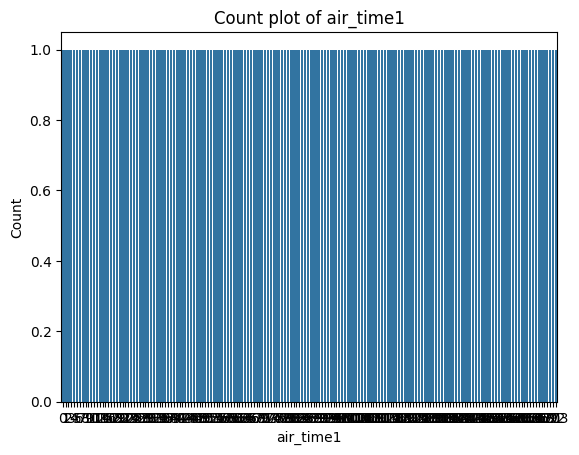

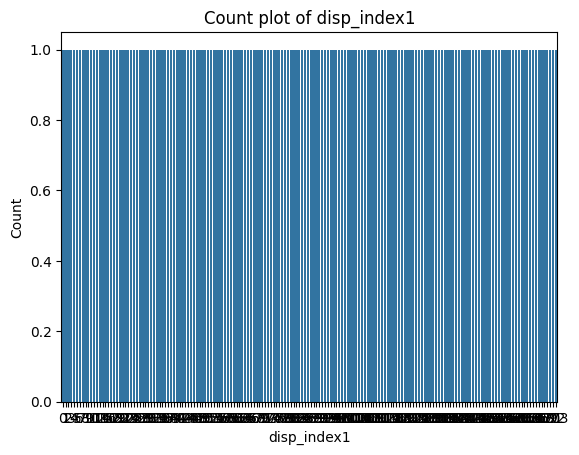

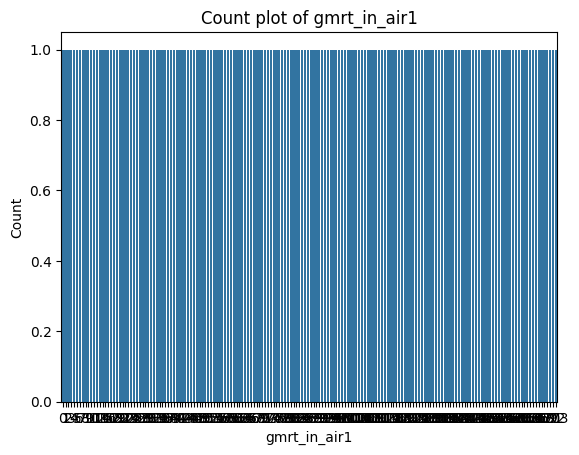

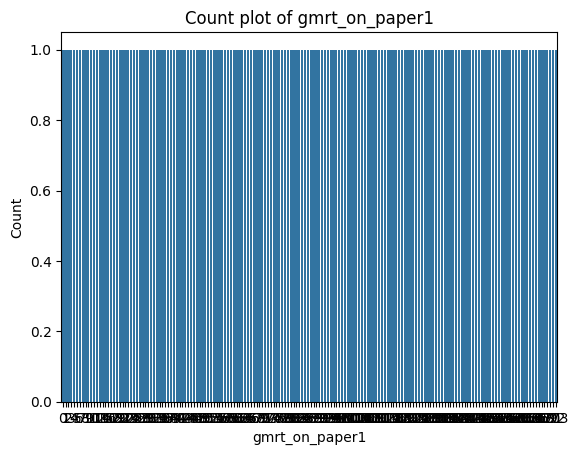

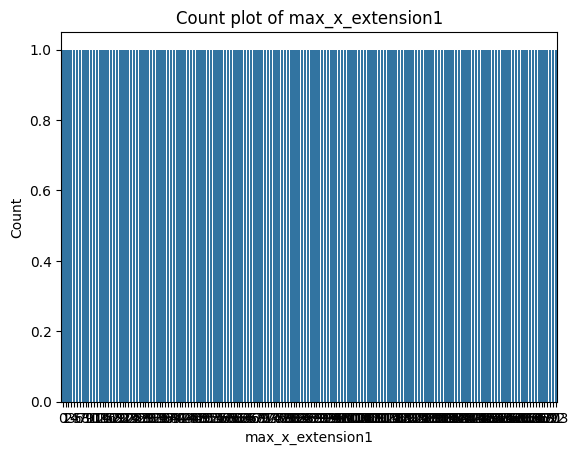

...

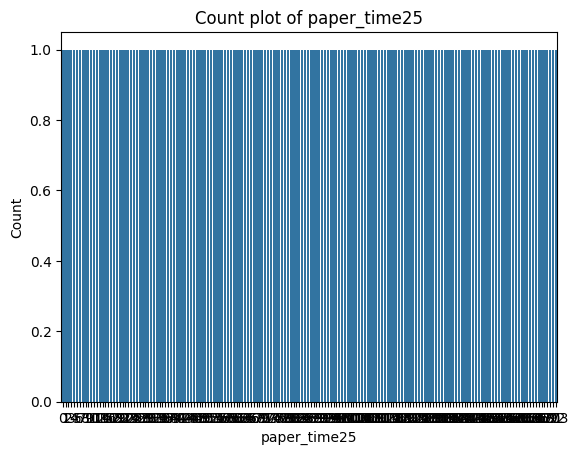

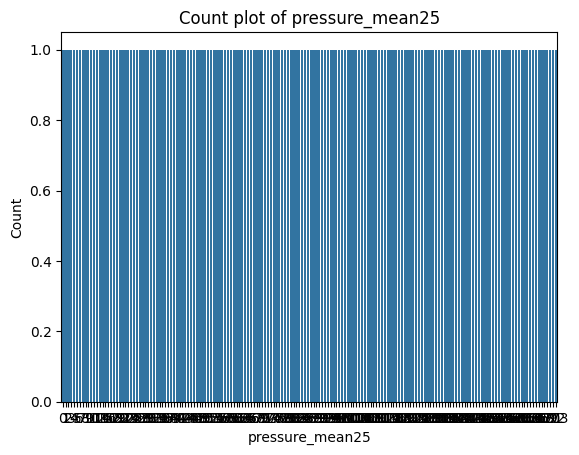

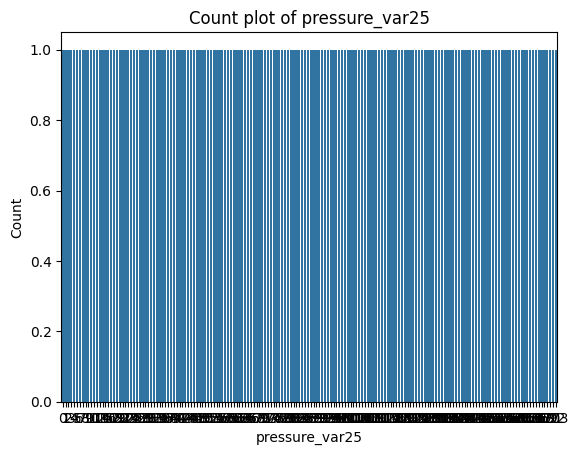

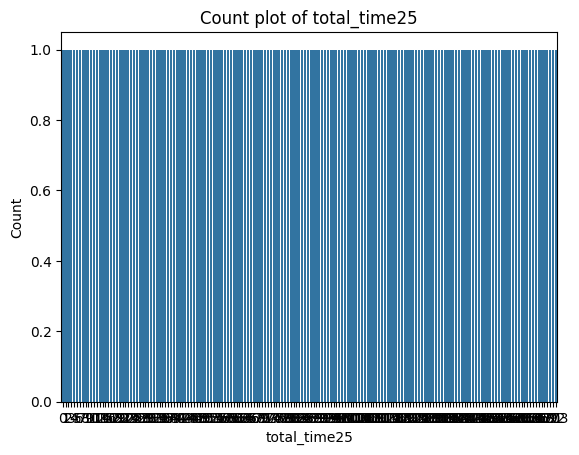

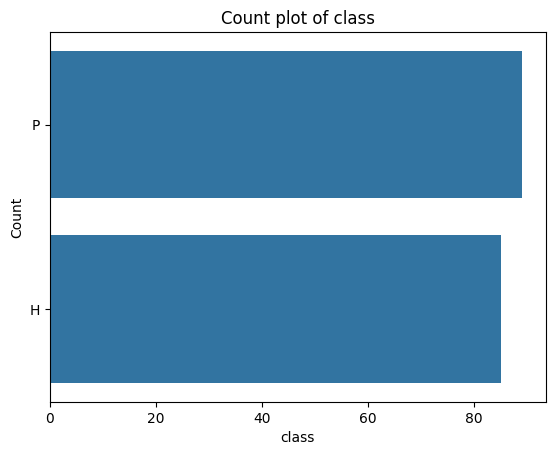

In [ ]:
categorical_columns = df.columns

for col in categorical_columns:
  sns.countplot(df[col])
  plt.title(f"Count plot of {col}")
  plt.xlabel(col)
  plt.ylabel("Count")
  plt.show()

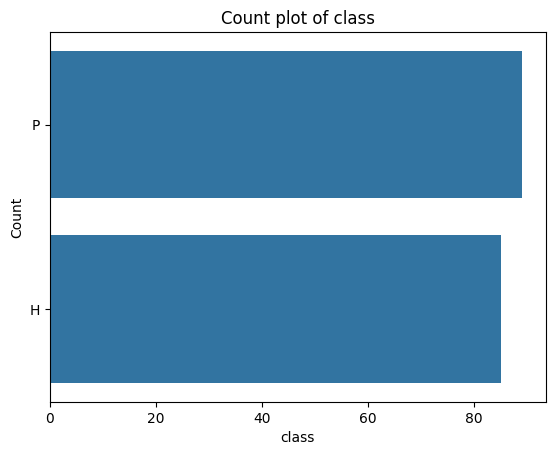

In [ ]:
sns.countplot(df["class"])
plt.title("Count plot of class")
plt.xlabel("class")
plt.ylabel("Count")
plt.show()

In [ ]:
#identifying object s with columns

object_columns = df.select_dtypes(include=['object']).columns
print(object_columns)

Index(['class'], dtype='object')


In [ ]:
#initilaize dictionary to store the encoders'

encoders = {}

for col in object_columns:
    encoder = LabelEncoder()
    df[col] = encoder.fit_transform(df[col])
    encoders[col] = encoder

    with open('encoders.pkl', 'wb') as f:
      pickle.dump(encoders, f)

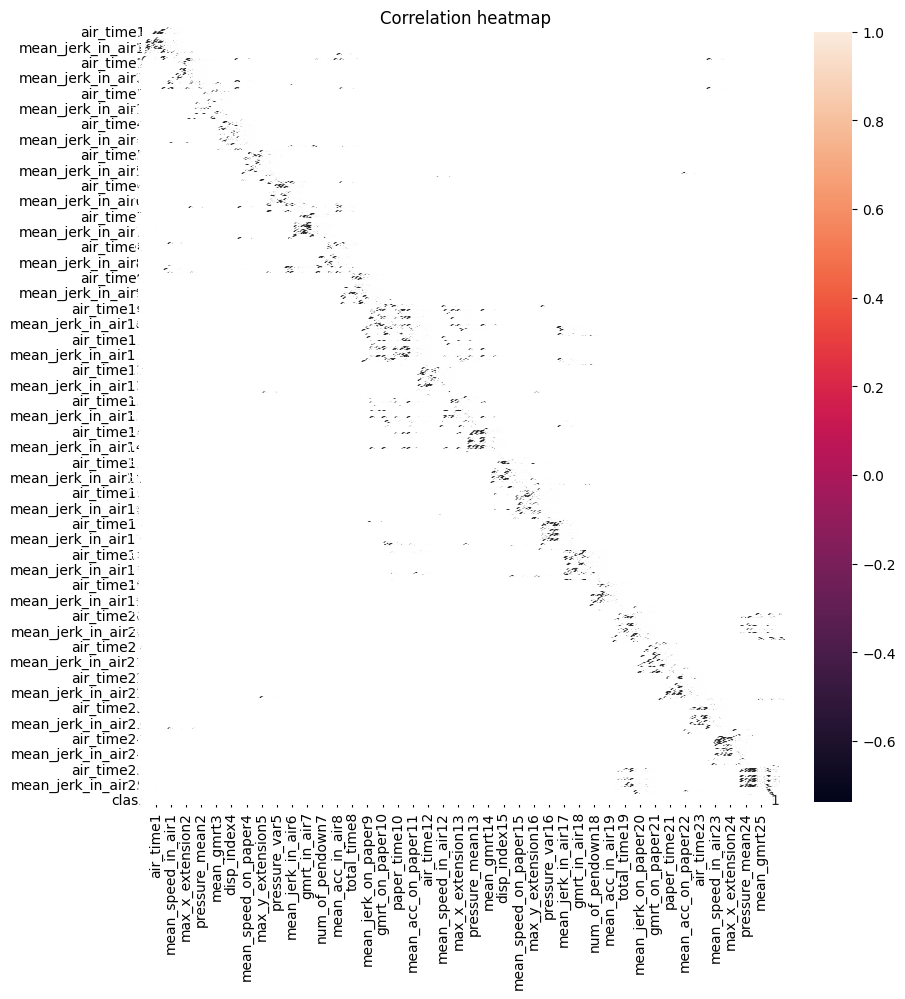

In [ ]:
# Bivariate Anaylsis

#correlation matrix

numeric_df = df.select_dtypes(include=['number'])

plt.figure(figsize=(10,10))
sns.heatmap(numeric_df.corr(), annot=True)
plt.title("Correlation heatmap")
plt.show()

In [ ]:
def replace_outliers_with_median(df, column):
    Q1 = df[column].quantile(0.25)
    Q3 = df[column].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR

    median = df[column].median()
    df[column] = df[column].apply(lambda x: median if x < lower_bound or x > upper_bound else x)

    return df

In [ ]:
df.columns


Index(['air_time1', 'disp_index1', 'gmrt_in_air1', 'gmrt_on_paper1',
       'max_x_extension1', 'max_y_extension1', 'mean_acc_in_air1',
       'mean_acc_on_paper1', 'mean_gmrt1', 'mean_jerk_in_air1',
       ...
       'mean_jerk_in_air25', 'mean_jerk_on_paper25', 'mean_speed_in_air25',
       'mean_speed_on_paper25', 'num_of_pendown25', 'paper_time25',
       'pressure_mean25', 'pressure_var25', 'total_time25', 'class'],
      dtype='object', length=451)

In [ ]:
x = df.drop("class", axis=1)
y = df["class"]

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=42)

In [ ]:
print(X_train.shape)
print(X_test.shape)
print(y_train.shape)
print(y_test.shape)

(139, 450)
(35, 450)
(139,)
(35,)


In [ ]:
X_test.value_counts()
y_test.value_counts()

,count
class,
1,20
0,15


In [ ]:
X_train.value_counts()
y_train.value_counts()

,count
class,
0,70
1,69


In [ ]:
X_train_smote, y_train_smote = SMOTE().fit_resample(X_train, y_train)

In [ ]:
print(X_train_smote.shape)
print(y_train_smote.shape)

(140, 450)
(140,)


In [ ]:
print(y_train_smote.value_counts())

class
0    70
1    70
Name: count, dtype: int64


In [ ]:
#klist of classifiers

models = {
    "Decision Tree": DecisionTreeClassifier(),
   "Random Forest": RandomForestClassifier(),
    "XGBoost": XGBClassifier()
}

In [ ]:
#dictionary to store the cross validation results

cv_results = {}

#perform cross validation

for model_name, model in models.items():
  print(f"Training {model_name} with default parameters")
  cv_result = cross_val_score(model, X_train_smote, y_train_smote, cv=5, scoring="accuracy")
  cv_results[model_name] = cv_result

  print(f"Cross validation results for {model_name}: {np.mean(cv_result):.2f}")
  print("-"*50)

Training Decision Tree with default parameters
Cross validation results for Decision Tree: 0.74
--------------------------------------------------
Training Random Forest with default parameters
Cross validation results for Random Forest: 0.85
--------------------------------------------------
Training XGBoost with default parameters
Cross validation results for XGBoost: 0.86
--------------------------------------------------


In [ ]:
cv_results


{'Decision Tree': array([0.75      , 0.78571429, 0.82142857, 0.71428571, 0.64285714]),
 'Random Forest': array([0.85714286, 0.85714286, 0.89285714, 0.78571429, 0.85714286]),
 'XGBoost': array([0.82142857, 0.85714286, 1.        , 0.82142857, 0.78571429])}

In [ ]:
decision_tree = DecisionTreeClassifier()
random_forest = RandomForestClassifier()
xgboost = XGBClassifier()

In [ ]:
param_grid_dt = {
    "criterion": ["gini", "entropy"],
    "max_depth": [None, 5, 10, 15],
    "min_samples_split": [2, 5, 10],
    "min_samples_leaf": [1, 2, 4]
}

param_grid_rf = {
    "n_estimators": [100, 200, 300],
    "max_depth": [None, 5, 10],
    "min_samples_split": [2, 5, 10],
    "min_samples_leaf": [1, 2, 4],
    "bootstrap": [True, False]
}


param_grid_xgb = {
    "n_estimators": [100, 200, 300],
    "learning_rate": [0.01, 0.1, 0.2],
    "max_depth": [3, 5, 7, 10],
    "learning_rate": [0.01, 0.1, 0.2, 0.3],
    "subsample": [0.8, 0.9, 1.0],
    "colsample_bytree": [0.8, 0.9, 1.0]
}

In [ ]:
random_search_dt = RandomizedSearchCV(estimator=decision_tree, param_distributions=param_grid_dt, n_iter=10, cv=5, scoring="accuracy", random_state=42)
random_search_dt.fit(X_train_smote, y_train_smote)

RandomizedSearchCV(cv=5, estimator=DecisionTreeClassifier(),
                   param_distributions={'criterion': ['gini', 'entropy'],
                                        'max_depth': [None, 5, 10, 15],
                                        'min_samples_leaf': [1, 2, 4],
                                        'min_samples_split': [2, 5, 10]},
                   random_state=42, scoring='accuracy')

In [ ]:
random_search_rf = RandomizedSearchCV(estimator=random_forest, param_distributions=param_grid_rf, n_iter=10, cv=5, scoring="accuracy", random_state=42)
random_search_rf.fit(X_train_smote, y_train_smote)

RandomizedSearchCV(cv=5, estimator=RandomForestClassifier(),
                   param_distributions={'bootstrap': [True, False],
                                        'max_depth': [None, 5, 10],
                                        'min_samples_leaf': [1, 2, 4],
                                        'min_samples_split': [2, 5, 10],
                                        'n_estimators': [100, 200, 300]},
                   random_state=42, scoring='accuracy')

In [ ]:
random_search_xgb = RandomizedSearchCV(estimator=xgboost, param_distributions=param_grid_xgb, n_iter=10, cv=5, scoring="accuracy", random_state=42)
random_search_xgb.fit(X_train_smote, y_train_smote)

RandomizedSearchCV(cv=5,
                   estimator=XGBClassifier(base_score=None, booster=None,
                                           callbacks=None,
                                           colsample_bylevel=None,
                                           colsample_bynode=None,
                                           colsample_bytree=None, device=None,
                                           early_stopping_rounds=None,
                                           enable_categorical=False,
                                           eval_metric=None, feature_types=None,
                                           gamma=None, grow_policy=None,
                                           importance_type=None,
                                           interaction_constraints=None,
                                           learning_rate...
                                           min_child_weight=None, missing=nan,
                                           monotone_constraints=None,
                                           multi_strategy=None,
                                           n_estimators=None, n_jobs=None,
                                           num_parallel_tree=None,
                                           random_state=None, ...),
                   param_distributions={'colsample_bytree': [0.8, 0.9, 1.0],
                                        'learning_rate': [0.01, 0.1, 0.2, 0.3],
                                        'max_depth': [3, 5, 7, 10],
                                        'n_estimators': [100, 200, 300],
                                        'subsample': [0.8, 0.9, 1.0]},
                   random_state=42, scoring='accuracy')

In [ ]:
best_model=None
best_score = 0

if random_search_dt.best_score_ > best_score:
  best_score = random_search_dt.best_score_
  best_model = random_search_dt.best_estimator_

if random_search_rf.best_score_ > best_score:
  best_score = random_search_rf.best_score_
  best_model = random_search_rf.best_estimator_

if random_search_xgb.best_score_ > best_score:
    best_score = random_search_xgb.best_score_
    best_model = random_search_xgb.best_estimator_

In [ ]:
print("Best Model:", best_model)
print("Best Score:", best_score)

Best Model: RandomForestClassifier(bootstrap=False, min_samples_leaf=4, n_estimators=300)
Best Score: 0.9214285714285715
